# Notebook 1: Data Collection

**Overview:** This notebook is concerned with how the training dataset is downloaded (and how images are queried from Google StreetView).

In [1]:
from constants import *
from streetview_query_functions import *
import numpy as np

In [2]:
# whether or not to redownload the dataset
DOWNLOAD_DATASET=False
NUM_OF_POINTS=200

## 1. Query Functions

All of the important querying functions are reused in notebook 3, so they are written out in `streetview_query_functions.py`. For example, we can test out sampling images from StreetView using the following image of my old apartment's alleyway:

**Validation Test:** This should be the following picture:

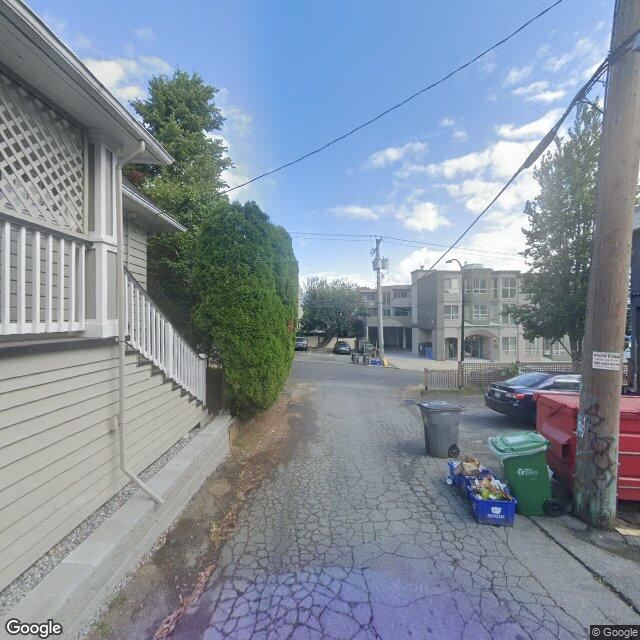

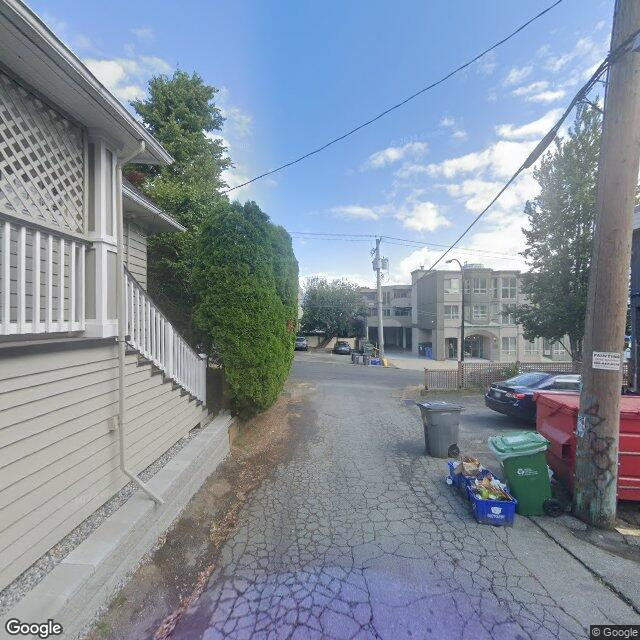

In [3]:
get_streetview_image(lat=49.2571476, lon=-123.1857815)

## 2. Road Geometry

We can use the boundaries to produce a simple overpass turbo query for all of the road geometry for our region, then query this to randomly sample points to obtain photos.

The following Overpass Turbo query was used:

```
[out:json][timeout:25];

area["name"="Oakland"]["boundary"="administrative"]->.searchArea;

(
  way["highway"~"motorway|trunk|primary|secondary|tertiary|residential"](area.searchArea);
);

out body;
>;
out skel qt;
```

producing the following map:

In [4]:
import geopandas
road_geo_gdf = geopandas.read_file(ROAD_GEOMETRY_FILENAME).to_crs(epsg=4326)
print(road_geo_gdf.head())

,id,@id,Bergen_County_database_ref,FIXME,FIXME:name,HFCS,NHS,NJDOT_SRI,access,access:lanes:backward,...,unsigned_ref,utility_wires,vehicle:conditional,vehicle:lanes,website,wheelchair,width,wikidata,wikipedia,geometry
0,way/4699870,way/4699870,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,"LINESTRING (-122.23037 37.77408, -122.23079 37..."
1,way/4757466,way/4757466,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,"LINESTRING (-122.30068 37.81424, -122.3002 37...."
2,way/4757566,way/4757566,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,"LINESTRING (-122.30306 37.82584, -122.30463 37..."
3,way/4757625,way/4757625,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,"LINESTRING (-122.31721 37.82322, -122.3168 37...."
4,way/4757626,way/4757626,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,"LINESTRING (-122.30819 37.82436, -122.30747 37..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13386,way/1502569067,way/1502569067,None,None,None,None,None,None,None,None,...,None,None,None,None,https://www.oaklandca.gov/projects/fruitvale-a...,None,None,None,None,"LINESTRING (-122.22268 37.78397, -122.22266 37..."
13387,way/1502702426,way/1502702426,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,"LINESTRING (-122.14869 37.74484, -122.14848 37..."
13388,way/1502702427,way/1502702427,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,"LINESTRING (-122.14579 37.74281, -122.14593 37..."
13389,way/1504807183,way/1504807183,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,"LINESTRING (-122.20392 37.80849, -122.20362 37..."


We can actually plot out this map for reference:

In [5]:
import folium
road_geometry_map = folium.Map(OAKLAND_COORDS, zoom_start=12)
folium.GeoJson(road_geo_gdf[["geometry"]]).add_to(road_geometry_map)
road_geometry_map

Then, we include only the data within our specified bounds:

In [6]:
from shapely.geometry import box
BBOX = box(*np.flip(BOTTOM_LEFT), *np.flip(TOP_RIGHT))
print(BBOX)
road_geo_gdf_clipped = road_geo_gdf[road_geo_gdf.intersects(BBOX)]
print(road_geo_gdf_clipped.head())

POLYGON ((-122.278666 37.810752, -122.278666 37.814505, -122.291342 37.814505, -122.291342 37.810752, -122.278666 37.810752))


We can now plot this new data alongside the bounding box (in red):

In [8]:
road_geometry_map_clipped = folium.Map(BOUNDARY_CENTER, zoom_start=16)
bbox_gdf = geopandas.GeoDataFrame(geometry=[BBOX], crs="EPSG:4326")
folium.GeoJson(road_geo_gdf_clipped[["geometry"]]).add_to(road_geometry_map_clipped)
folium.GeoJson(
    bbox_gdf, style_function=lambda x: {
        'fill': False,
        'color': 'red',
        'weight': 2
    }
).add_to(road_geometry_map_clipped)
road_geometry_map_clipped

Obviously, this code isn't perfect (there's clearly a bunch of roads that are escaping the bounding box), but this is actually fine. The roads just outside of the bounds can be safely assumed to be more or less uniform with the roads inside the box, so it'll still be fine for collecting data. This code also ignores intersections with `is_intersection`.

The goal here is simple: we want to just grab points within the distribution more or less at random (but we try not to oversample roads that are disproportionately long by weighting them according to the lengths of the roads).

In [9]:
from shapely.geometry import LineString
import geopandas as gpd
import random

def random_sample_road_point(road_gdf_projected, delta_denom=32, max_tries=10):
    """
    Sample a random valid road point and compute viewing directions.
    """
    
    # weight the roads by length
    lengths = road_gdf_projected.geometry.length
    weights = lengths / lengths.sum()
    
    # setup a function to check for the intersections
    is_intersection_fn = make_intersection_checker(road_gdf_projected)
    
    # we may need to reject this point, so this can happen multiple times
    for _ in range(max_tries):
        road = road_gdf_projected.sample(1, weights=weights).geometry.iloc[0]
        
        # if this is actually a multiline string, then we just pick one at random
        if road.geom_type == "MultiLineString":
            road = random.choice(list(road.geoms))
        
        # then we can filter it out if its broken geometry
        if road.length == 0:
            continue
        
        if delta_denom < 1:
            raise ValueError('Delta denominator must be >= 1')
        
        delta = road.length / delta_denom
        if road.length < 2 * delta:
            continue
        
        # then we just select a random point on the road
        distance = random.uniform(delta, road.length - delta)
        point = road.interpolate(distance)
        
        # ignore it if it is on an intersection
        if is_intersection_fn(point):
            continue
        
        # compute the principal directions
        directions, ref_points_projected = compute_tangent_angles(road, point, delta)
        
        # convert this to lat/lon
        to_latlon = lambda points: \
            gpd.GeoSeries(points, crs=road_gdf_projected.crs).to_crs(epsg=4326).iloc[0]
        
        # then return the point, its principal directions, and 
        # the reference points used to compute those directions
        return to_latlon(point), directions, [to_latlon(ref_point) for ref_point in ref_points_projected]
    
    raise RuntimeError("Failed to sample valid road point")

Now, we can test out collecting a random road point by projecting the clipped dataframe then sampling it at random:

In [11]:
road_geo_gdf_clipped_projected = road_geo_gdf_clipped.to_crs(road_geo_gdf_clipped.estimate_utm_crs())
example_random_point, example_point_road_dir, example_reference_points = \
    random_sample_road_point(road_geo_gdf_clipped_projected)

print('Obtained Point ::', example_random_point)
print(f'Principal Directions: {example_point_road_dir} deg')
print('Reference Points ::', example_reference_points[0], example_reference_points[1])

Obtained Point :: POINT (-122.28549398735795 37.81138025005526)
Principal Directions: [195 285  15 105] deg
Reference Points :: POINT (-122.28546851568274 37.8114504763182) POINT (-122.28551945898393 37.81131002378551)


The principal directions are the two parallel and perpendicular directions to the road, so we can plot what we have and check that these directions match those perspectives:

Direction: 195


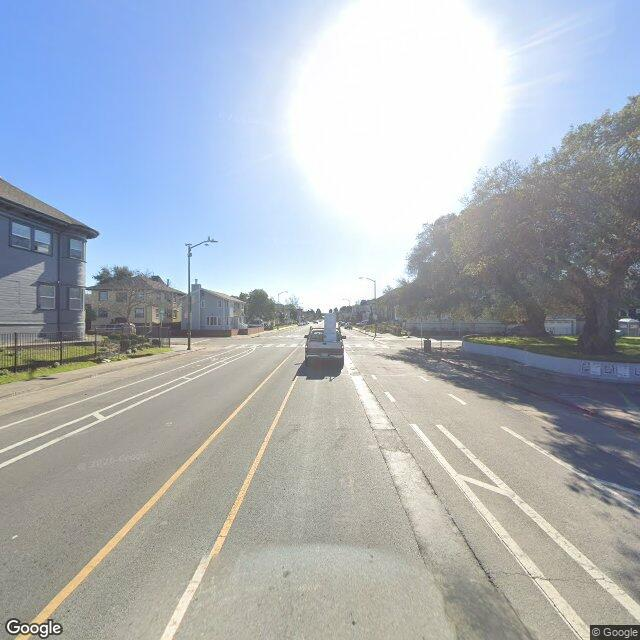

Direction: 285


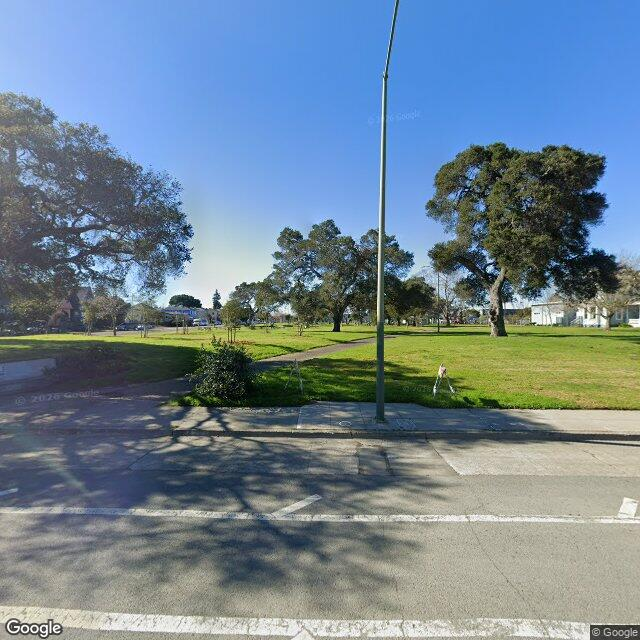

Direction: 15


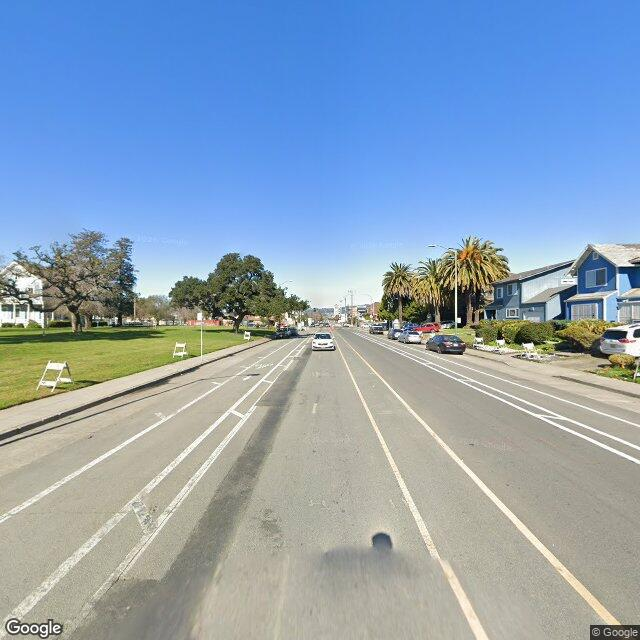

Direction: 105


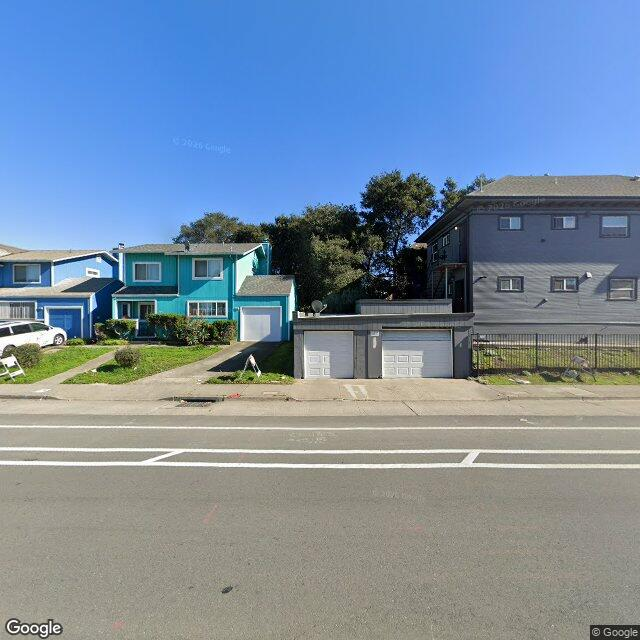

In [12]:
from IPython.display import display

for direction in example_point_road_dir:
    print(f'Direction: {direction}')
    display(query_streetview_point(
        example_random_point, 
        direction=direction
    ))

and this was obtained from the following point and reference points:

In [13]:
folium.Marker(
    location=point_to_array(example_random_point),
    popup='Randomly selected point'
).add_to(road_geometry_map_clipped)

folium.Marker(
    location=point_to_array(example_reference_points[0]),
    popup='Reference Point 1'
).add_to(road_geometry_map_clipped)

folium.Marker(
    location=point_to_array(example_reference_points[1]),
    popup='Reference Point 2'
).add_to(road_geometry_map_clipped)

road_geometry_map_clipped

## 3. Mass Data Collection

Now, we just apply this all over the region for the number of points that we want:

In [14]:
import csv, shutil

def download_all_images(num_points):
    # Reset directories
    if os.path.exists(DATASET_OUTPUT_DIR):
        shutil.rmtree(DATASET_OUTPUT_DIR)
    
    os.makedirs(DATASET_OUTPUT_DIR)
    os.makedirs(IMAGE_FILE_OUTPUT)
    
    interval = max(num_points // 10, 1)
    
    print(f'Writing Metadata to {METADATA_FILE_OUTPUT}')
    
    # OPEN FILE ONCE (important)
    with open(METADATA_FILE_OUTPUT, 'w', newline='') as csv_file:
        csv_writer = csv.writer(csv_file)
        csv_writer.writerow(METADATA_HEADER)
        
        # for each point
        for count in range(1, num_points + 1):
            
            # we get the point and its principal directions
            point, directions, _ = random_sample_road_point()
            
            # for each direction
            for i, direction in enumerate(directions):
                # we query the image
                image = query_streetview_point(point, direction=direction)
                
                image_label = f'{count}-{i+1}.png'
                image_path = f'{IMAGE_FILE_OUTPUT}/{image_label}'
                
                # Save the image
                image.save(image_path)
                
                # and write out its metadata to the master file
                csv_writer.writerow([image_label, point.y, point.x, direction])
                
                # free memory
                image.close()
                del image
            
            if count % interval == 0:
                print(f'{(count / num_points) * 100:.0f}% - {count}/{num_points}')
    
    print('Image Download Completed!')

Now we can try downloading a bunch of images:

In [15]:
if __name__ == "__main__" and DOWNLOAD_DATASET:
    download_all_images(NUM_OF_POINTS)
else:
    print('Not Downloading Images')

Not Downloading Images


Now, we can validate that the metadata saved correctly:

In [16]:
import pandas as pd

metadata = pd.read_csv(METADATA_FILE_OUTPUT)
print(metadata.head())

     LABEL        LAT         LON         DIR
0  1-1.png  37.813061 -122.278920  295.931012
1  1-2.png  37.813061 -122.278920   25.931012
2  1-3.png  37.813061 -122.278920  115.931012
3  1-4.png  37.813061 -122.278920  205.931012
4  2-1.png  37.814087 -122.290491  195.441417


And plot a map of every place that we downloaded from:

In [17]:
import folium

map_center = (metadata['LAT'].mean(), metadata['LON'].mean())
m = folium.Map(location=map_center, zoom_start=12)

folium.GeoJson(
    bbox_gdf, style_function=lambda x: {
        'fill': False,
        'color': 'red',
        'weight': 2
    }
).add_to(m)

for _, row in metadata.iterrows():
    pos = [ row['LAT'], row['LON'] ]
    direction = row['DIR']
    label = row['LABEL']
    
    folium.Marker(
        location=pos,
        popup=f"Label: {label}\nDirection: {direction}°"
    ).add_to(m)
    
m

And we can plot the first 3 side-to-side to see the fruits of our labor:

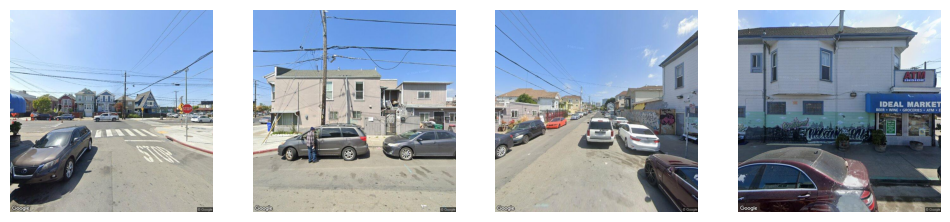

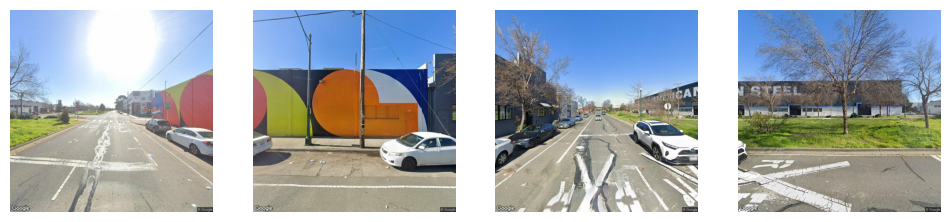

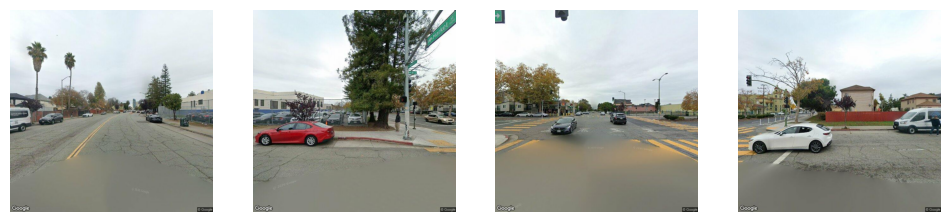

In [18]:
from matplotlib import pyplot as plt
from matplotlib import image as mpimg

stop_at=3
for i in range(1, stop_at+1):
    fig, ax = plt.subplots(1,4, figsize=(12,3))
    
    image = lambda n: mpimg.imread(f'{IMAGE_FILE_OUTPUT}/{i}-{n}.png')
    
    for j in range(4):
        ax[j].imshow(image(j+1))
        ax[j].axis('off')
    
plt.show()